In [ ]:
!nvidia-smi

Wed Mar 18 05:35:10 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   59C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Install the Ultralytics Package

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 41.8 MB/s eta 0:00:00


# Import all required libraries

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.4.23 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 44.0/112.6 GB disk)


In [ ]:

from ultralytics import YOLO
from IPython.display import Image

# Download Dataset from Roboflow

https://universe.roboflow.com/project-uyrxf/ppe_detection-v1x3l/dataset/1

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="vUVx6ODSYdpqIXBjYjvS")
project = rf.workspace("project-uyrxf").project("ppe_detection-v1x3l")
version = project.version(1)
dataset = version.download("yolov11")



loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to PPE_Detection-1 in yolov11:: 100%|██████████| 6560/6560 [00:00<00:00, 6719.25it/s]


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="vUVx6ODSYdpqIXBjYjvS")
project = rf.workspace("project-uyrxf").project("ppe_detection-v1x3l")
version = project.version(1)
dataset = version.download("yolov11")


* Accesses the workspace named "project-uyrxf" (your
Roboflow workspace ID).

* Then it selects the project "ppe_detection-v1x3l".

* This is your dataset project on Roboflow, probably about PPE (Personal Protective Equipment) detection.
Each project in Roboflow can have multiple versions (v1, v2, …).

* dataset = version.download("yolov11")

This line selects version 1 of your dataset.

Versions differ if you reprocess or update the dataset with augmentations, preprocessing, etc.

* Downloads the dataset in a format ready for YOLOv11 training.

Roboflow supports many formats (YOLO, TensorFlow, PyTorch, COCO, VOC, etc.).

After downloading, you’ll get a folder with images and labels (train/valid/test splits).

* data.yaml tells YOLO where your train/val/test images are and what the class names are.

**  This script authenticates → selects project → picks version → downloads dataset in YOLOv11 format. **

In [ ]:
dataset.location

'/content/PPE_Detection-1'

In [ ]:
!ls

In [ ]:
!find /content/PPE_Detection-1 -maxdepth 2 -type d

/content/PPE_Detection-1


In [ ]:
!rm -rf /content/PPE_Detection-1

# Train YOLO11 Model on a Custom Dataset

In [ ]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=5 imgsz=640


Ultralytics 8.4.23 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/PPE_Detection-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspec

mode=train

Tells YOLO to train a model.

Other modes:

predict → run inference on images/videos

val → evaluate performance on validation set

export → export to ONNX, TensorRT, CoreML, etc.

***
model="yolo11n.pt"

Specifies the pretrained YOLOv11n model (nano version = smallest and fastest, but least accurate).

Other sizes: yolo11s.pt, yolo11m.pt, yolo11l.pt, yolo11x.pt (increasing size/accuracy).

It will fine-tune this pretrained model on your PPE dataset.

***
epochs=5

Number of training iterations over the entire dataset.

Here: 5 epochs (for testing/quick training).

In practice, for good accuracy, people use 50–300 epochs.

***
imgsz=640

Image size (resolution) used for training.

All input images are resized to 640x640.

Larger sizes (e.g., 1280) give more accuracy but need more GPU.

** This command trains YOLOv11n on your PPE dataset for 5 epochs with images resized to 640×640.**

# Examine Training Results

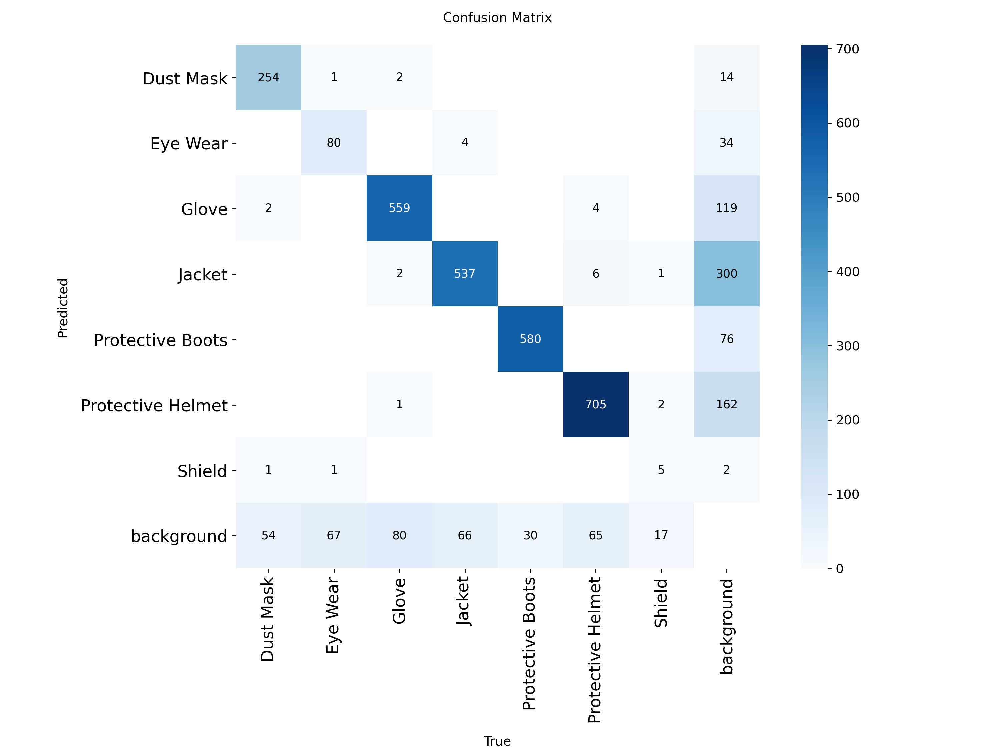

In [ ]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)

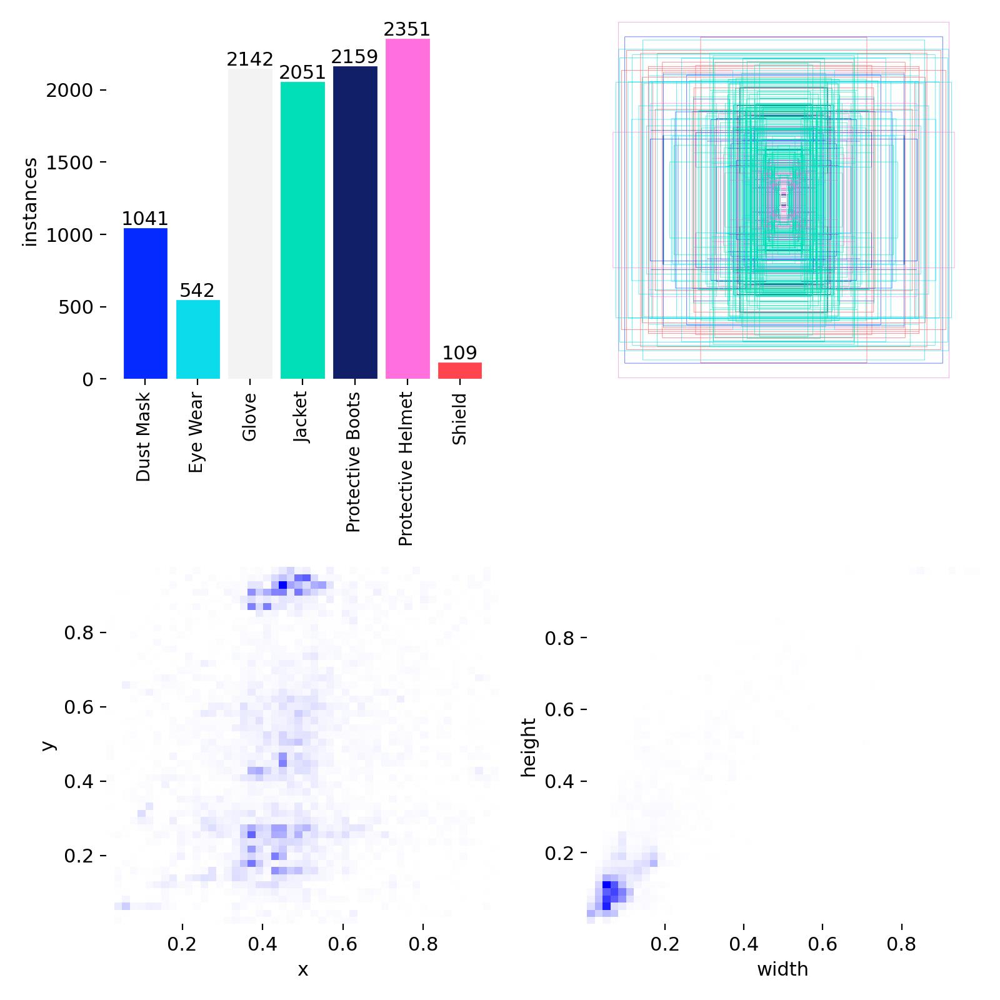

In [ ]:
Image("/content/runs/detect/train/labels.jpg", width=600)

In [ ]:
#complete evaluation

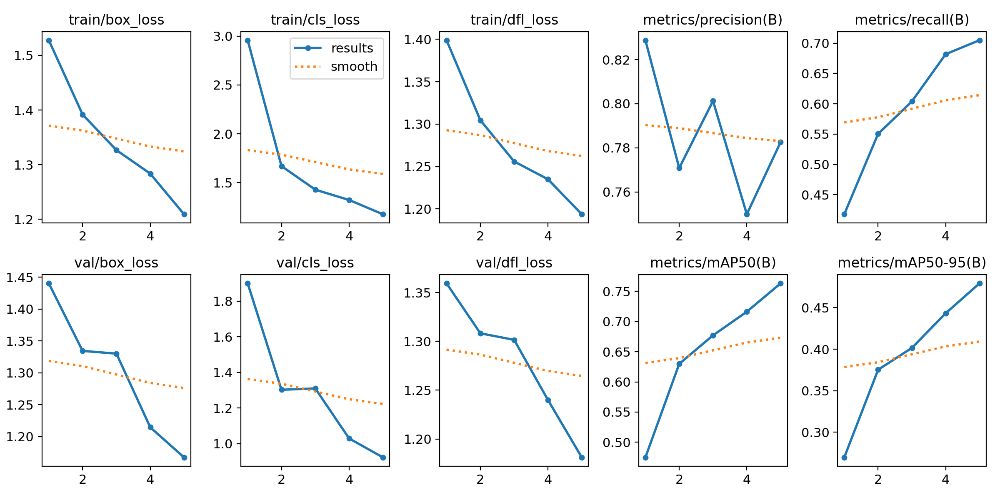

In [ ]:
Image("/content/runs/detect/train/results.png", width=600)

mAP = mean Average Precision

It measures how well your model detects and classifies objects.

It is based on precision-recall curves for each class, then averaged across all classes.

In short:

mAP@0.5 → lenient (good for quick evaluation).

mAP@0.5:0.95 → strict, realistic (used for benchmarks like COCO).

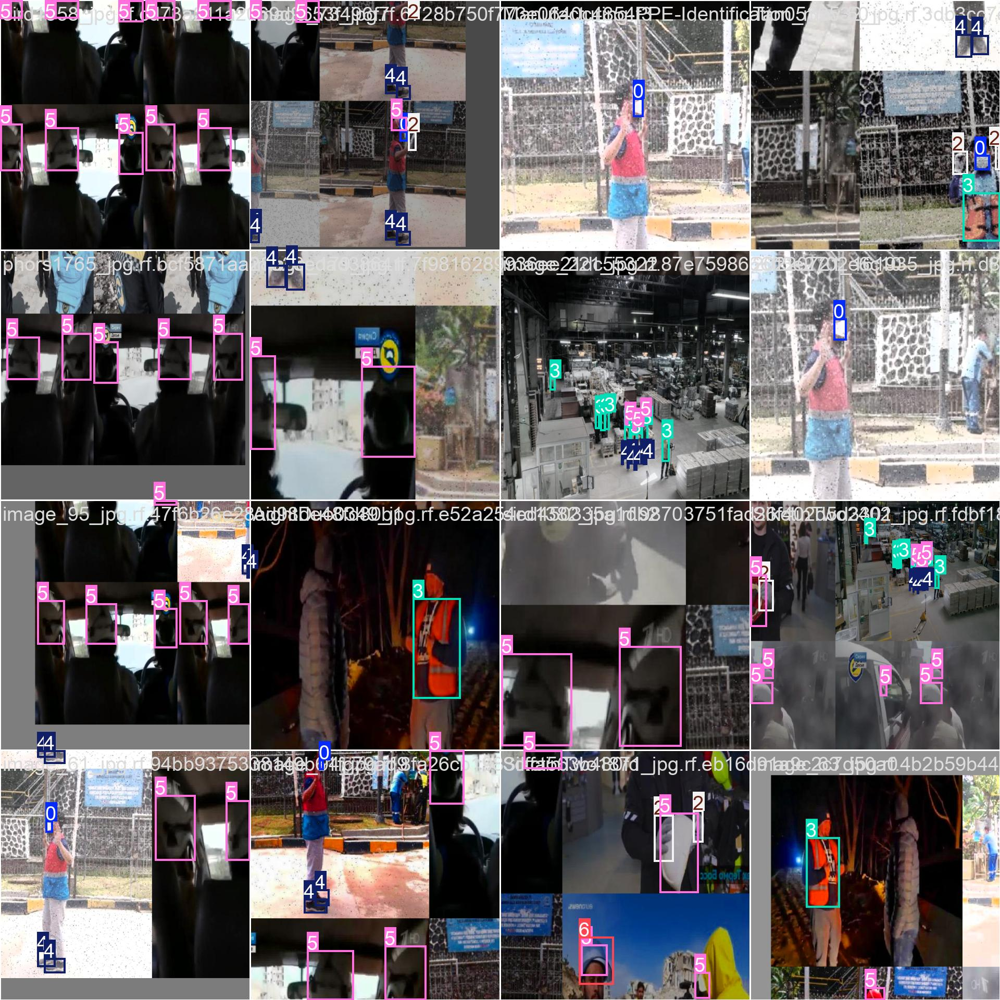

In [ ]:
# plot some batch images
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

This line displays the training batch visualization image (with bounding boxes) generated by YOLO, resized to width 600 px, so you can visually confirm your dataset is loading properly.

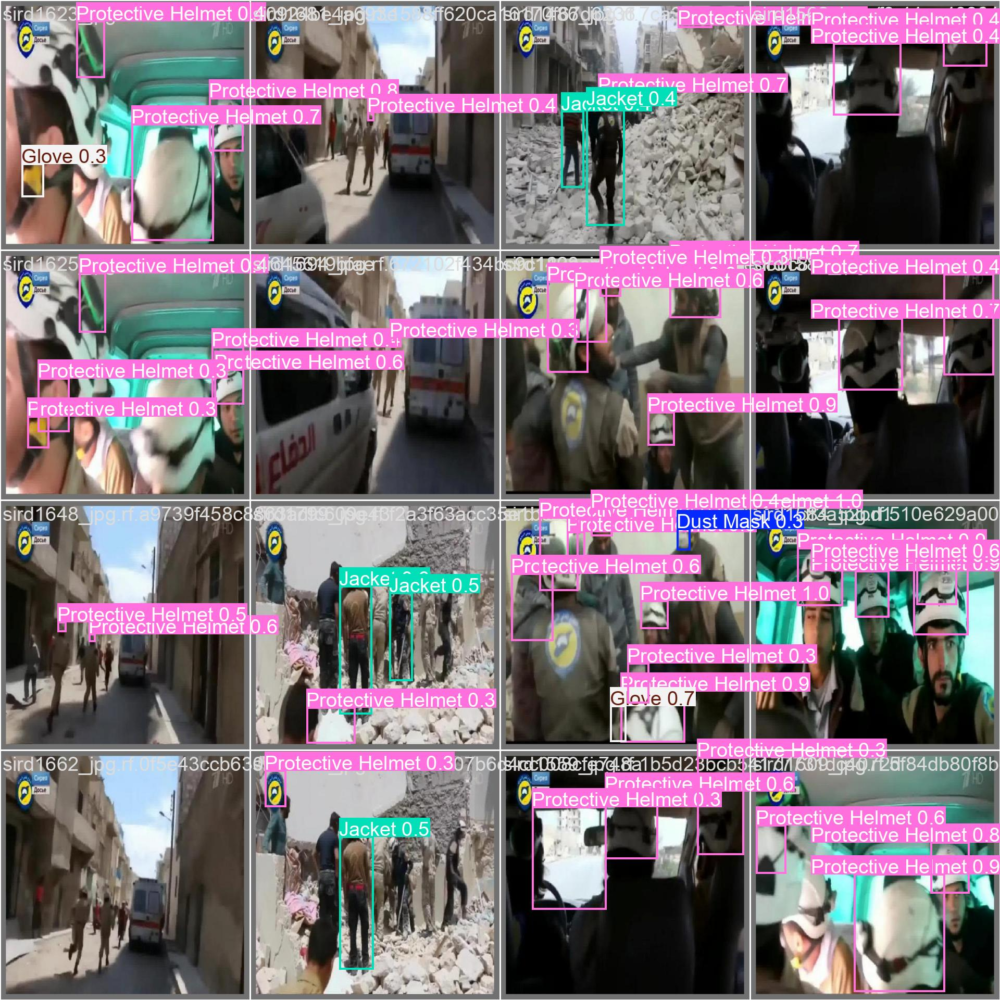

In [ ]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

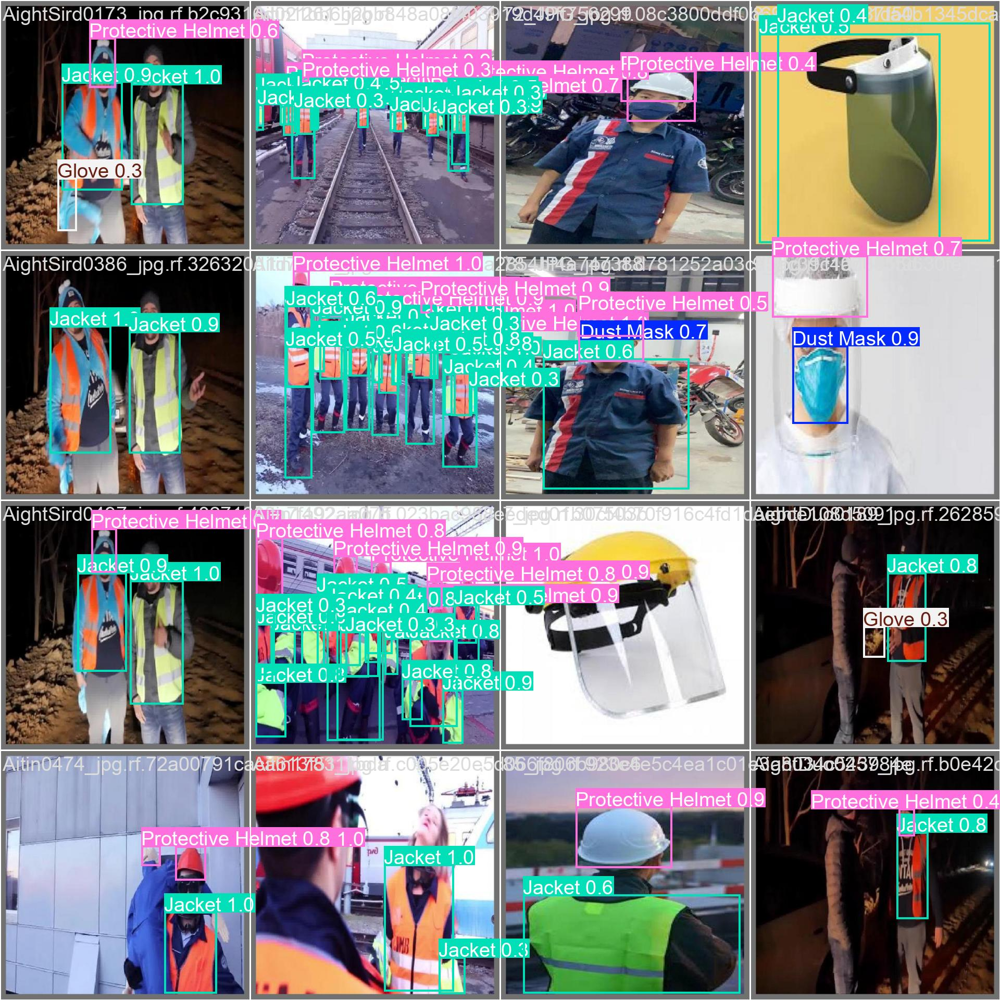

In [ ]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=600)

This line displays the YOLO model’s predictions on validation images (val batch 1) so you can visually check how well your trained model is detecting PPE objects.

In [ ]:

!yolo task=detect mode=val model="/content/runs/detect/train/weights/best.pt" data={dataset.location}/data.yaml
#map score should be close to 1 it means your model is performing better

Ultralytics 8.4.23 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2279.1±1101.5 MB/s, size: 65.7 KB)
val: Scanning /content/PPE_Detection-1/valid/labels.cache... 649 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 649/649 123.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 41/41 5.1it/s 8.0s
                   all        649       3126      0.782      0.706      0.763       0.48
             Dust Mask        301        311      0.951      0.804      0.872      0.528
              Eye Wear        148        149      0.744      0.483      0.581       0.26
                 Glove        354        644      0.875      0.848      0.893      0.567
                Jacket        364        607      0.706      0.848      0.865      0.606
      Protective Boots        299   

This command evaluates your trained YOLOv11 model (best.pt) on the validation dataset, and reports performance metrics like mAP, precision, recall, and also saves prediction visualizations.

# Inference wih Custom Model on Images

In [ ]:
!yolo task=detect mode=predict model="/content/runs/detect/train6/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

conf=0.25

Sets the confidence threshold (default is 0.25).

Predictions below 25% confidence are ignored (reduces false positives).

You can adjust (e.g., conf=0.5 for stricter results).

***
This command runs inference with your trained model on the test dataset, keeping predictions above 25% confidence, and saves the output images with bounding boxes.

In [ ]:

import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")


glob → finds file paths matching a pattern (like *.jpg).

os → used here to check folder modification times.

IPyImage & display → to show images inside a Jupyter/Colab notebook.

In [ ]:

!gdown "https://drive.google.com/uc?id=1ACZp9gmtjEdIY-SHp8K0xdR0D8Gjd3j3&confirm=t"

In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train6/weights/best.pt" conf=0.25 source=image2.jpg save=True

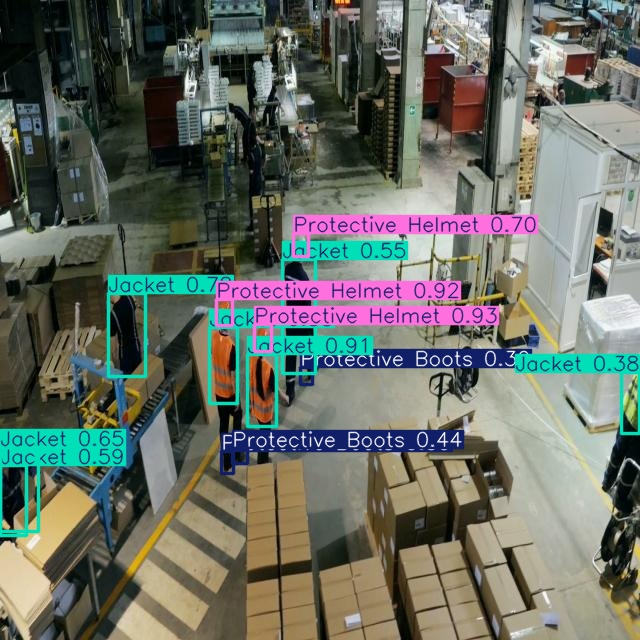

In [ ]:
Image("/content/runs/detect/predict2/image2.jpg", width=600)

# Inference with Custom Model on Videos

In [ ]:

!gdown "https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t"

In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train6/weights/best.pt" conf=0.25 source="PPE_Part2.mp4" save=True


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict4/PPE_Part2.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width="640" height="480" controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")


HTML → lets you embed custom HTML inside a Jupyter/Colab cell.

b64encode → encodes binary data (like a video file) into Base64 so it can be embedded in HTML.

os → runs system commands (ffmpeg in this case).
***
Runs FFmpeg (a video processing tool).

-i {save_path} → input video file.

-vcodec libx264 → re-encodes using H.264 codec (widely supported, smaller file size).

{compressed_path} → saves result as result_compressed.mp4.

✅ This makes the video smaller and compatible with browsers (AVI oft

****
Opens the compressed .mp4 file in binary mode (rb).

Converts it into Base64 string (b64encode).

Prepares a data URL so the video can be embedded inline in the notebook.
***
Creates an HTML <video> player with:

width="640" height="480" → display size.

controls → adds play/pause/volume buttons.

<source> tag → loads the Base64-encoded video.

HTML(...) → displays it directly inside the notebook output.


In [ ]:
!gdown "https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t"

In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source="PPE_Part1.mp4" save=True


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict3/PPE_Part1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width="640" height="480" controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")